In [1]:
#import os
#os.environ["OMP_NUM_THREADS"] = "4" # export OMP_NUM_THREADS=4
#os.environ["OPENBLAS_NUM_THREADS"] = "4" # export OPENBLAS_NUM_THREADS=4 
#os.environ["MKL_NUM_THREADS"] = "6" # export MKL_NUM_THREADS=6
#os.environ["VECLIB_MAXIMUM_THREADS"] = "4" # export VECLIB_MAXIMUM_THREADS=4
#os.environ["NUMEXPR_NUM_THREADS"] = "6" # export NUMEXPR_NUM_THREADS=6

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings


def remove_warnings(*args, **kwargs):
    pass


warnings.warn = remove_warnings()



## Data Cleaning and Exploration

In [3]:
dataset = pd.read_csv('CC GENERAL.csv')

In [4]:
dataset.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [5]:
dataset.head().T

,0,1,2,3,4
CUST_ID,C10001,C10002,C10003,C10004,C10005
BALANCE,40.900749,3202.467416,2495.148862,1666.670542,817.714335
BALANCE_FREQUENCY,0.818182,0.909091,1.0,0.636364,1.0
PURCHASES,95.4,0.0,773.17,1499.0,16.0
ONEOFF_PURCHASES,0.0,0.0,773.17,1499.0,16.0
INSTALLMENTS_PURCHASES,95.4,0.0,0.0,0.0,0.0
CASH_ADVANCE,0.0,6442.945483,0.0,205.788017,0.0
PURCHASES_FREQUENCY,0.166667,0.0,1.0,0.083333,0.083333
ONEOFF_PURCHASES_FREQUENCY,0.0,0.0,1.0,0.083333,0.083333
PURCHASES_INSTALLMENTS_FREQUENCY,0.083333,0.0,0.0,0.0,0.0


### Dataset Cleaning

In [6]:
dataset.drop('CUST_ID', axis=1, inplace=True)

#### Dealing with Null Values

In [7]:
dataset.isna().any()


BALANCE                             False
BALANCE_FREQUENCY                   False
PURCHASES                           False
ONEOFF_PURCHASES                    False
INSTALLMENTS_PURCHASES              False
CASH_ADVANCE                        False
PURCHASES_FREQUENCY                 False
ONEOFF_PURCHASES_FREQUENCY          False
PURCHASES_INSTALLMENTS_FREQUENCY    False
CASH_ADVANCE_FREQUENCY              False
CASH_ADVANCE_TRX                    False
PURCHASES_TRX                       False
CREDIT_LIMIT                         True
PAYMENTS                            False
MINIMUM_PAYMENTS                     True
PRC_FULL_PAYMENT                    False
TENURE                              False
dtype: bool

In [8]:
min_payment_nan_index = dataset['MINIMUM_PAYMENTS'].isna()
dataset['MINIMUM_PAYMENTS'][min_payment_nan_index]

3      NaN
45     NaN
47     NaN
54     NaN
55     NaN
        ..
8919   NaN
8929   NaN
8935   NaN
8944   NaN
8946   NaN
Name: MINIMUM_PAYMENTS, Length: 313, dtype: float64

In [9]:
# pd.set_option('display.max_rows', None)
dataset['MINIMUM_PAYMENTS'].describe()

count     8637.000000
mean       864.206542
std       2372.446607
min          0.019163
25%        169.123707
50%        312.343947
75%        825.485459
max      76406.207520
Name: MINIMUM_PAYMENTS, dtype: float64

In [10]:
dataset['CREDIT_LIMIT'].describe()

count     8949.000000
mean      4494.449450
std       3638.815725
min         50.000000
25%       1600.000000
50%       3000.000000
75%       6500.000000
max      30000.000000
Name: CREDIT_LIMIT, dtype: float64

In [11]:
min_payments = dataset['MINIMUM_PAYMENTS'].values.reshape(-1,1)
min_payments.shape

(8950, 1)

In [12]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='mean')

dataset['MINIMUM_PAYMENTS'] = imputer.fit_transform(min_payments)


In [13]:
dataset.isna().any()

BALANCE                             False
BALANCE_FREQUENCY                   False
PURCHASES                           False
ONEOFF_PURCHASES                    False
INSTALLMENTS_PURCHASES              False
CASH_ADVANCE                        False
PURCHASES_FREQUENCY                 False
ONEOFF_PURCHASES_FREQUENCY          False
PURCHASES_INSTALLMENTS_FREQUENCY    False
CASH_ADVANCE_FREQUENCY              False
CASH_ADVANCE_TRX                    False
PURCHASES_TRX                       False
CREDIT_LIMIT                         True
PAYMENTS                            False
MINIMUM_PAYMENTS                    False
PRC_FULL_PAYMENT                    False
TENURE                              False
dtype: bool

In [14]:
#pd.set_option('display.max_rows', 20)
dataset['MINIMUM_PAYMENTS']


0        139.509787
1       1072.340217
2        627.284787
3        864.206542
4        244.791237
           ...     
8945      48.886365
8946     864.206542
8947      82.418369
8948      55.755628
8949      88.288956
Name: MINIMUM_PAYMENTS, Length: 8950, dtype: float64

In [15]:
nan_index = dataset['CREDIT_LIMIT'].isna()
nan_index = dataset['CREDIT_LIMIT'][nan_index].index[0]
nan_index

5203

In [16]:
dataset.iloc[nan_index, :] # corresponding row values of null value

BALANCE                              18.400472
BALANCE_FREQUENCY                     0.166667
PURCHASES                             0.000000
ONEOFF_PURCHASES                      0.000000
INSTALLMENTS_PURCHASES                0.000000
CASH_ADVANCE                        186.853063
PURCHASES_FREQUENCY                   0.000000
ONEOFF_PURCHASES_FREQUENCY            0.000000
PURCHASES_INSTALLMENTS_FREQUENCY      0.000000
CASH_ADVANCE_FREQUENCY                0.166667
CASH_ADVANCE_TRX                      1.000000
PURCHASES_TRX                         0.000000
CREDIT_LIMIT                               NaN
PAYMENTS                              9.040017
MINIMUM_PAYMENTS                     14.418723
PRC_FULL_PAYMENT                      0.000000
TENURE                                6.000000
Name: 5203, dtype: float64

In [17]:
dataset.drop(axis=0, index=nan_index, inplace=True)

In [18]:
dataset.isna().any()

BALANCE                             False
BALANCE_FREQUENCY                   False
PURCHASES                           False
ONEOFF_PURCHASES                    False
INSTALLMENTS_PURCHASES              False
CASH_ADVANCE                        False
PURCHASES_FREQUENCY                 False
ONEOFF_PURCHASES_FREQUENCY          False
PURCHASES_INSTALLMENTS_FREQUENCY    False
CASH_ADVANCE_FREQUENCY              False
CASH_ADVANCE_TRX                    False
PURCHASES_TRX                       False
CREDIT_LIMIT                        False
PAYMENTS                            False
MINIMUM_PAYMENTS                    False
PRC_FULL_PAYMENT                    False
TENURE                              False
dtype: bool

In [19]:
# checking for duplicated data
dataset.duplicated().any()

False

### Data Exploration

In [20]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8949.0,1564.647593,2081.584016,0.000000,128.365782,873.680279,2054.372848,19043.13856
BALANCE_FREQUENCY,8949.0,0.877350,0.236798,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8949.0,1003.316936,2136.727848,0.000000,39.800000,361.490000,1110.170000,49039.57000
ONEOFF_PURCHASES,8949.0,592.503572,1659.968851,0.000000,0.000000,38.000000,577.830000,40761.25000
INSTALLMENTS_PURCHASES,8949.0,411.113579,904.378205,0.000000,0.000000,89.000000,468.650000,22500.00000
CASH_ADVANCE,8949.0,978.959616,2097.264344,0.000000,0.000000,0.000000,1113.868654,47137.21176
PURCHASES_FREQUENCY,8949.0,0.490405,0.401360,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8949.0,0.202480,0.298345,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8949.0,0.364478,0.397451,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8949.0,0.135141,0.200132,0.000000,0.000000,0.000000,0.222222,1.50000


In [21]:
dataset.select_dtypes(include=['int', 'float']).columns

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'],
      dtype='object')

In [22]:
dataset.dtypes

BALANCE                             float64
BALANCE_FREQUENCY                   float64
PURCHASES                           float64
ONEOFF_PURCHASES                    float64
INSTALLMENTS_PURCHASES              float64
CASH_ADVANCE                        float64
PURCHASES_FREQUENCY                 float64
ONEOFF_PURCHASES_FREQUENCY          float64
PURCHASES_INSTALLMENTS_FREQUENCY    float64
CASH_ADVANCE_FREQUENCY              float64
CASH_ADVANCE_TRX                      int64
PURCHASES_TRX                         int64
CREDIT_LIMIT                        float64
PAYMENTS                            float64
MINIMUM_PAYMENTS                    float64
PRC_FULL_PAYMENT                    float64
TENURE                                int64
dtype: object

In [23]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8949.0,1564.647593,2081.584016,0.000000,128.365782,873.680279,2054.372848,19043.13856
BALANCE_FREQUENCY,8949.0,0.877350,0.236798,0.000000,0.888889,1.000000,1.000000,1.00000
PURCHASES,8949.0,1003.316936,2136.727848,0.000000,39.800000,361.490000,1110.170000,49039.57000
ONEOFF_PURCHASES,8949.0,592.503572,1659.968851,0.000000,0.000000,38.000000,577.830000,40761.25000
INSTALLMENTS_PURCHASES,8949.0,411.113579,904.378205,0.000000,0.000000,89.000000,468.650000,22500.00000
CASH_ADVANCE,8949.0,978.959616,2097.264344,0.000000,0.000000,0.000000,1113.868654,47137.21176
PURCHASES_FREQUENCY,8949.0,0.490405,0.401360,0.000000,0.083333,0.500000,0.916667,1.00000
ONEOFF_PURCHASES_FREQUENCY,8949.0,0.202480,0.298345,0.000000,0.000000,0.083333,0.300000,1.00000
PURCHASES_INSTALLMENTS_FREQUENCY,8949.0,0.364478,0.397451,0.000000,0.000000,0.166667,0.750000,1.00000
CASH_ADVANCE_FREQUENCY,8949.0,0.135141,0.200132,0.000000,0.000000,0.000000,0.222222,1.50000


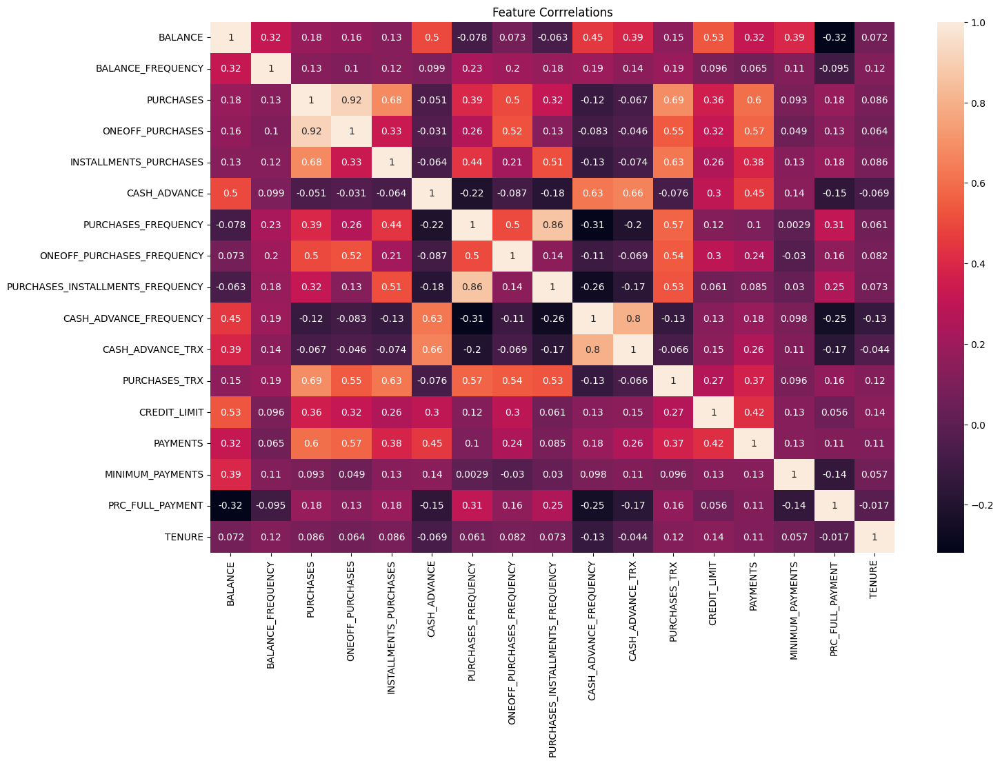

In [24]:
feature_correlations = dataset.corr()
plt.figure(figsize=(16,10))
plt.title("Feature Corrrelations")
sns.heatmap(feature_correlations, annot=True)
plt.show()

## Data Preparation for Cluster Analysis

### Data Preprocessing

In [25]:
dataset.shape

(8949, 17)

In [26]:
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer

numerical_columns = dataset.select_dtypes(include=['int', 'float']).columns
scaler = StandardScaler()
scaler.set_output(transform='pandas')
scaling = ColumnTransformer([('scaling', scaler, numerical_columns)], verbose_feature_names_out=False)

scaling.set_output(transform='pandas')

scaled_dataset = scaling.fit_transform(dataset)

In [27]:
scaled_dataset

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.310993,-0.525588,0.360541
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.089265,0.234159,0.360541
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.101699,-0.525588,0.360541
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.000041,-0.525588,0.360541
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.265819,-0.525588,0.360541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,-0.738015,0.517980,-0.333331,-0.356957,-0.132688,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.486266,-0.349878,1.183844,-4.126919
8946,-0.742488,0.517980,-0.329174,-0.356957,-0.122869,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.503445,-0.000041,-0.525588,-4.126919
8947,-0.740463,-0.185895,-0.402000,-0.356957,-0.294930,-0.466805,0.854463,-0.678716,0.760359,-0.675294,-0.476083,-0.390691,-0.960380,-0.570660,-0.335490,0.329128,-4.126919
8948,-0.745239,-0.185895,-0.469584,-0.356957,-0.454607,-0.449373,-1.221928,-0.678716,-0.917090,0.157536,-0.183026,-0.591841,-1.097795,-0.580581,-0.346930,0.329128,-4.126919


In [28]:
scaled_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
BALANCE,8949.0,0.000000e+00,1.000056,-0.751704,-0.690033,-0.331962,0.235279,8.397195
BALANCE_FREQUENCY,8949.0,-3.144205e-16,1.000056,-3.705263,0.048731,0.517980,0.517980,0.517980
PURCHASES,8949.0,-8.257509e-17,1.000056,-0.469584,-0.450956,-0.300395,0.050011,22.482478
ONEOFF_PURCHASES,8949.0,-4.128754e-17,1.000056,-0.356957,-0.356957,-0.334063,-0.008840,24.199846
INSTALLMENTS_PURCHASES,8949.0,1.746781e-17,1.000056,-0.454607,-0.454607,-0.356191,0.063623,24.425755
CASH_ADVANCE,8949.0,-1.587982e-17,1.000056,-0.466805,-0.466805,-0.466805,0.064330,22.010021
PURCHASES_FREQUENCY,8949.0,7.701715e-17,1.000056,-1.221928,-1.014290,0.023907,1.062103,1.269742
ONEOFF_PURCHASES_FREQUENCY,8949.0,-6.351930e-18,1.000056,-0.678716,-0.678716,-0.399383,0.326887,2.673295
PURCHASES_INSTALLMENTS_FREQUENCY,8949.0,4.605149e-17,1.000056,-0.917090,-0.917090,-0.497727,0.970040,1.599083
CASH_ADVANCE_FREQUENCY,8949.0,-1.270386e-17,1.000056,-0.675294,-0.675294,-0.675294,0.435143,6.820167


In [29]:
preprocessed_dataset = scaled_dataset

In [30]:
preprocessed_dataset

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-0.310993,-0.525588,0.360541
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,0.089265,0.234159,0.360541
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-0.101699,-0.525588,0.360541
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,-0.000041,-0.525588,0.360541
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-0.265819,-0.525588,0.360541
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,-0.738015,0.517980,-0.333331,-0.356957,-0.132688,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.486266,-0.349878,1.183844,-4.126919
8946,-0.742488,0.517980,-0.329174,-0.356957,-0.122869,-0.466805,1.269742,-0.678716,1.179720,-0.675294,-0.476083,-0.350461,-0.960380,-0.503445,-0.000041,-0.525588,-4.126919
8947,-0.740463,-0.185895,-0.402000,-0.356957,-0.294930,-0.466805,0.854463,-0.678716,0.760359,-0.675294,-0.476083,-0.390691,-0.960380,-0.570660,-0.335490,0.329128,-4.126919
8948,-0.745239,-0.185895,-0.469584,-0.356957,-0.454607,-0.449373,-1.221928,-0.678716,-0.917090,0.157536,-0.183026,-0.591841,-1.097795,-0.580581,-0.346930,0.329128,-4.126919


In [31]:
preprocessed_dataset.shape[1]

17

### Dimensionality Reduction Using PCA

In [32]:
# finding the optimal number of principal components

from sklearn.decomposition import PCA


def find_optimal_PCA(dataset, desired_variance, minimum_component_number=3):

    for component_number in range(minimum_component_number, dataset.shape[1]+1):
        pca = PCA(n_components=component_number, random_state=42)
        pca.set_output(transform='pandas')
        pca_dataset = pca.fit_transform(dataset)
        component_variance = pca.explained_variance_ratio_
        if component_variance.sum() >= desired_variance:
            return pca_dataset
    return pca_dataset


pca_dataset = find_optimal_PCA(dataset=preprocessed_dataset, desired_variance=0.85)

In [33]:
pca_dataset

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7
0,-1.682360,-1.076720,0.490160,0.664694,0.018464,0.052407,0.828485,-0.038237
1,-1.138967,2.506112,0.602491,-0.120915,0.611466,-1.131525,-0.376092,0.132460
2,0.969377,-0.383427,0.103995,1.207674,-2.173293,-0.229391,-1.570585,-0.170924
3,-0.873812,0.042929,1.461940,1.150399,0.295738,-0.121248,-0.280568,-0.559750
4,-1.599682,-0.688769,0.367029,0.988980,-0.487534,0.075215,0.706868,0.209574
...,...,...,...,...,...,...,...,...
8945,-0.359268,-2.015733,-1.002524,-2.729321,0.255753,2.678073,-1.527346,0.193100
8946,-0.564020,-1.638742,-1.297119,-1.862009,0.170028,3.386896,-1.085520,-0.562139
8947,-0.925785,-1.810490,-0.481547,-2.282564,0.372032,2.981586,-1.372776,-0.354346
8948,-2.336211,-0.657802,0.968613,-1.865871,0.054580,3.180394,-0.934899,0.140190


# Building the K-Means Clustering Model

In [34]:
from sklearn.cluster import KMeans


k_means = KMeans(n_clusters=3, init='k-means++', 
            max_iter=999, n_init=10, random_state=101)

k_means.fit(pca_dataset)

KMeans(max_iter=999, n_clusters=3, n_init=10, random_state=101)

In [35]:
labels = k_means.labels_
labels

array([0, 2, 0, ..., 0, 0, 0])

## Determining the Optimal Number of Clusters 

### Calinski-Harabasz Score

In [36]:
from sklearn.metrics import calinski_harabasz_score
ch_scores = list()
max_cluster = 10
for clus_no in range(2, max_cluster+1):
    k_means = KMeans(n_clusters=clus_no, 
                     init='k-means++', max_iter=999, 
                     n_init=10, random_state=42)
    k_means.fit(pca_dataset)
    ch = calinski_harabasz_score(pca_dataset, 
                                 k_means.labels_)
    ch_scores.append(ch)



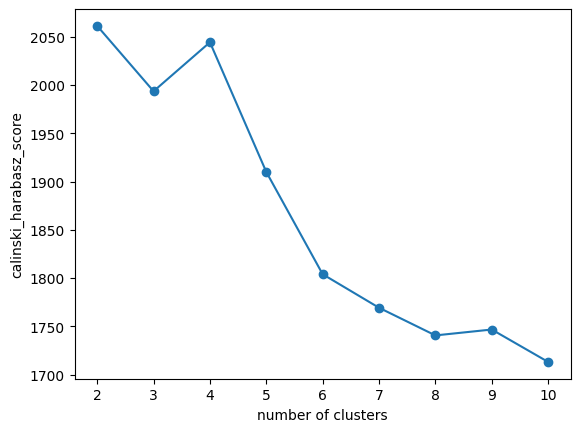

In [37]:
plt.plot(range(2, max_cluster+1), ch_scores, 'o-')
plt.xlabel('number of clusters') 
plt.ylabel('calinski_harabasz_score')
plt.show()

### Elbow Method

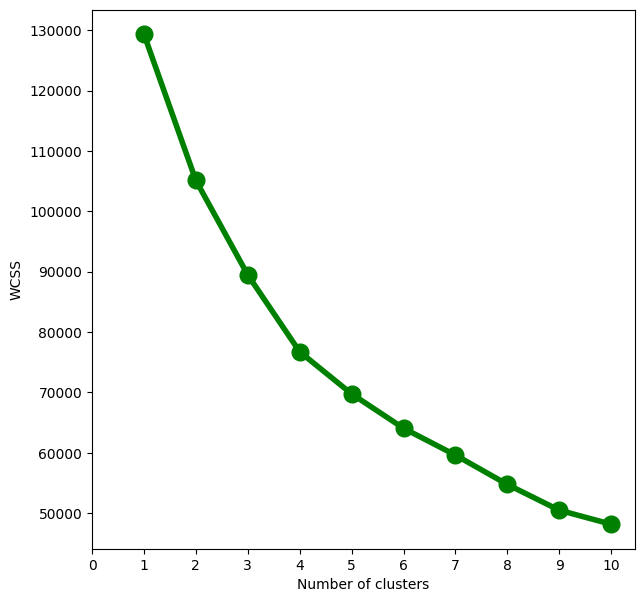

In [38]:
WCSS = []
for i in range(1,11):
    model = KMeans(n_clusters = i, init = 'random', n_init=10)
    model.fit(pca_dataset)
    WCSS.append(model.inertia_)
fig = plt.figure(figsize = (7,7))
plt.plot(range(1,11),WCSS, linewidth=4, markersize=12,marker='o',color = 'green')
plt.xticks(np.arange(11))
plt.xlabel("Number of clusters")
plt.ylabel("WCSS")
plt.show()

#### It can be concluded from the two methods used that the optimal number of clusters is 4.

In [39]:
optimal_cluster_number = 4

k_means = KMeans(n_clusters=optimal_cluster_number, 
                     init='k-means++', max_iter=999, 
                     n_init=10, random_state=101)

k_means.fit(pca_dataset)

KMeans(max_iter=999, n_clusters=4, n_init=10, random_state=101)

## Visualization of the Clusters

In [97]:
pca_dataset["k_means_labels"] = k_means.labels_
pca_dataset

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,k_means_labels
0,-1.682360,-1.076720,0.490160,0.664694,0.018464,0.052407,0.828485,-0.038237,1
1,-1.138967,2.506112,0.602491,-0.120915,0.611466,-1.131525,-0.376092,0.132460,2
2,0.969377,-0.383427,0.103995,1.207674,-2.173293,-0.229391,-1.570585,-0.170924,3
3,-0.873812,0.042929,1.461940,1.150399,0.295738,-0.121248,-0.280568,-0.559750,1
4,-1.599682,-0.688769,0.367029,0.988980,-0.487534,0.075215,0.706868,0.209574,1
5,0.250995,-0.780077,-1.131529,0.839030,0.816124,0.382866,0.794092,0.040343,3
6,6.352683,-0.691655,2.080870,-0.820783,-1.091483,-1.016830,-1.406114,1.130235,0
7,0.276844,-1.290781,-1.828279,0.213122,0.170303,-0.077470,0.420321,-0.529752,3
8,-0.441998,-0.461909,0.192739,1.016341,-0.269875,-0.306497,-0.084314,-0.460281,1
9,-0.562578,-0.366567,1.955858,0.970467,0.362807,-0.653695,-0.769479,-1.069986,1


### 2-D Visualization

In [87]:
np.unique(k_means.labels_)

array([0, 1, 2, 3])

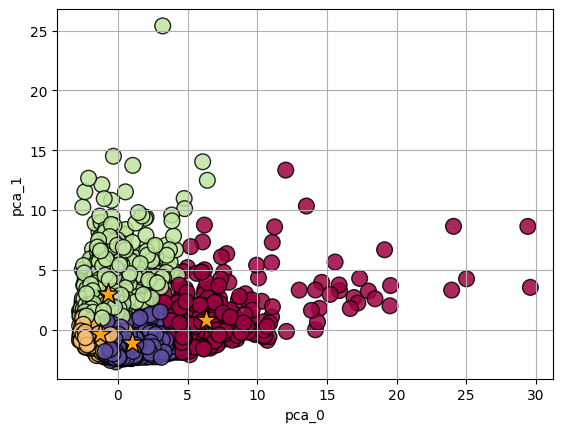

In [84]:
plt.scatter(pca_dataset.iloc[:,0], pca_dataset.iloc[:,1], s=2**7, c=k_means.labels_, 
            edgecolors='black', alpha=0.85, cmap='Spectral')

plt.xlabel('pca_0') 
plt.ylabel('pca_1')
plt.grid()

km_centers = k_means.cluster_centers_

plt.scatter(km_centers[:,0], km_centers[:,1],
            s=2**8, marker='*', c='orange', edgecolors='black') 

plt.show()

### 3-D Visualization

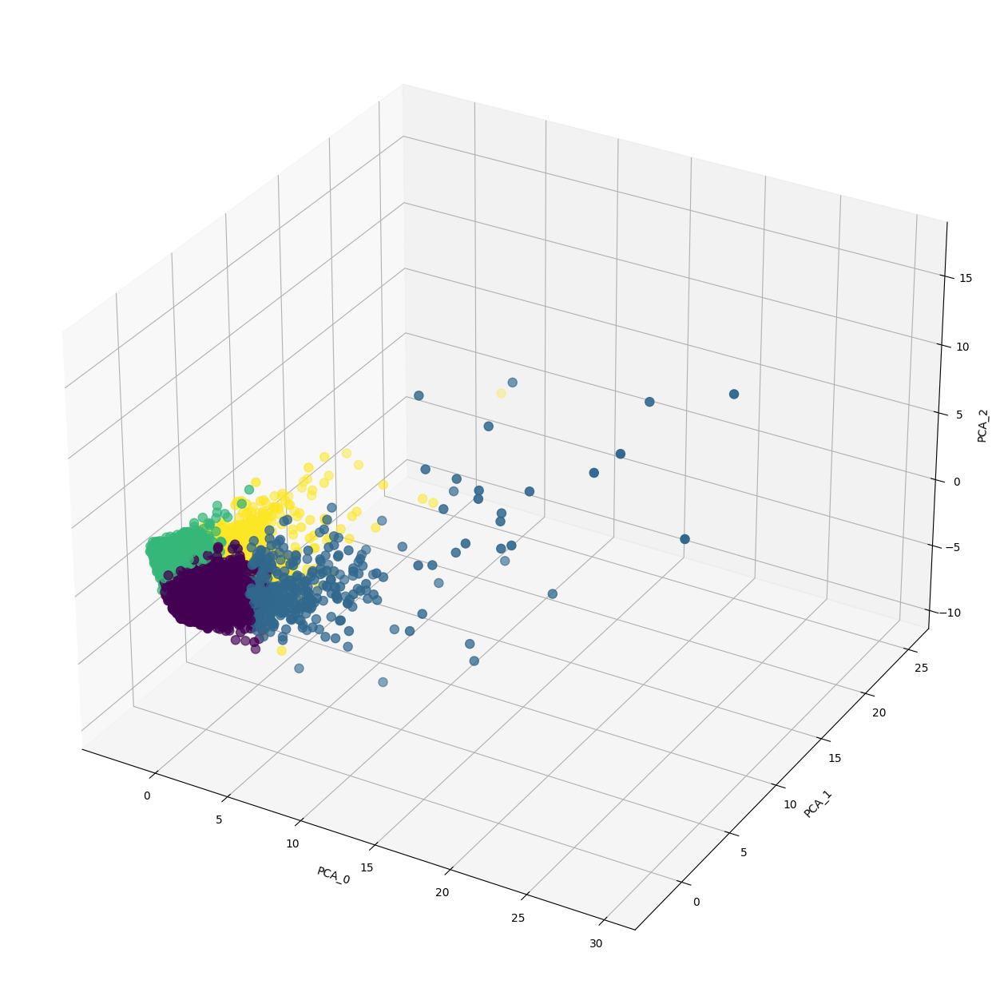

In [42]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(16,16))
ax = fig.add_subplot(111, projection='3d')
#labels = ['cluster 1', 'cluster 2', 'cluster 3', 'cluster 4', 'cluster 5']


ax.scatter(pca_dataset.iloc[:,0], pca_dataset.iloc[:,1], pca_dataset.iloc[:,2], s=2**6, c=k_means.labels_, marker='o', zdir='z')

ax.set_xlabel('PCA_0')
ax.set_ylabel('PCA_1')
ax.set_zlabel('PCA_2')
plt.show()

Iteration: 1


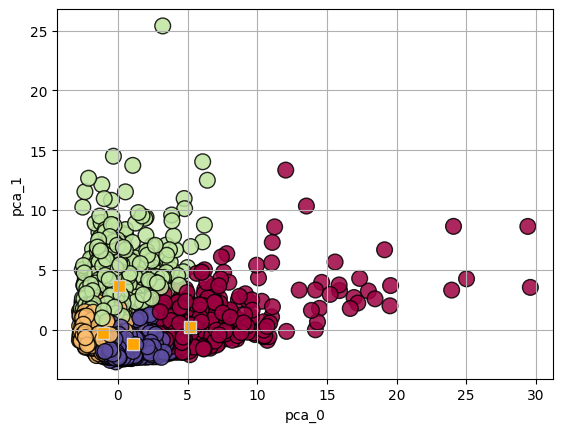

Iteration: 2


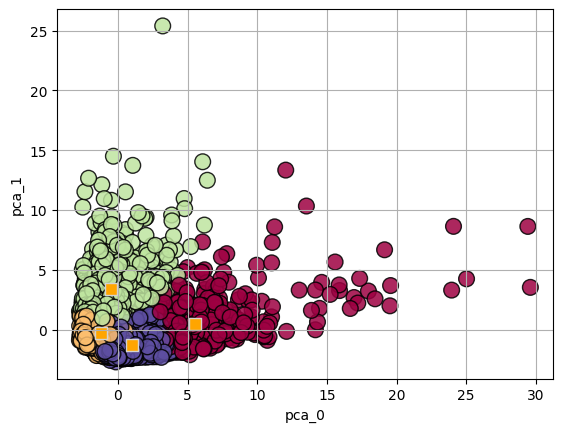

Iteration: 3


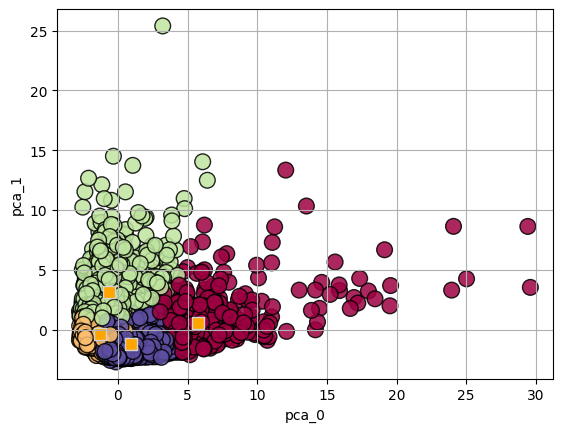

Iteration: 4


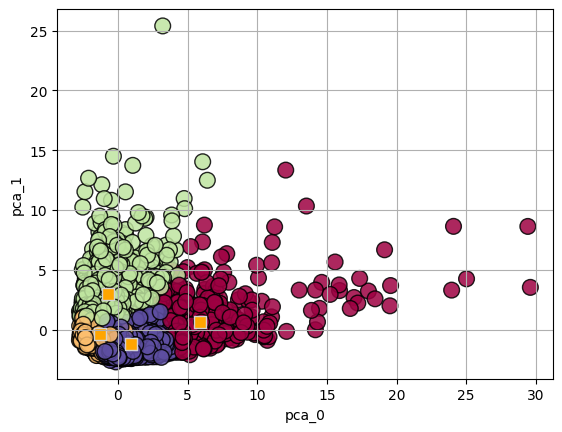

Iteration: 5


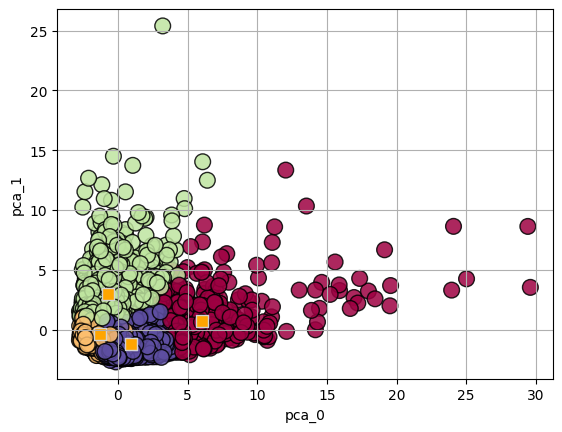

Iteration: 6


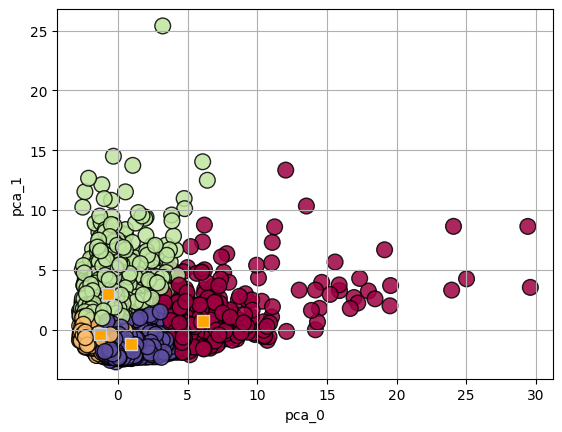

Iteration: 7


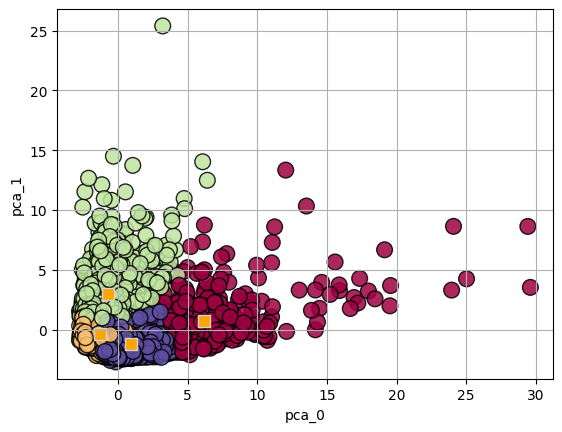

Iteration: 8


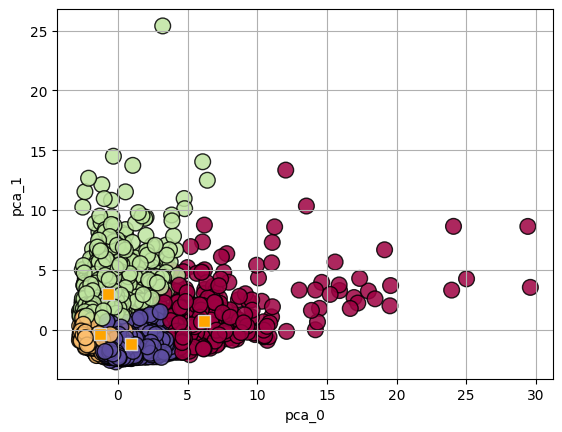

Iteration: 9


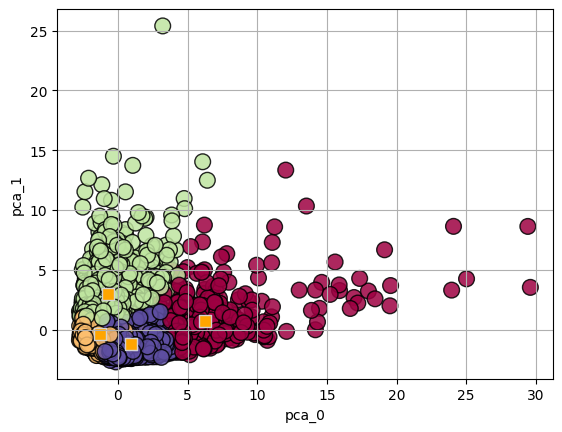

Iteration: 10


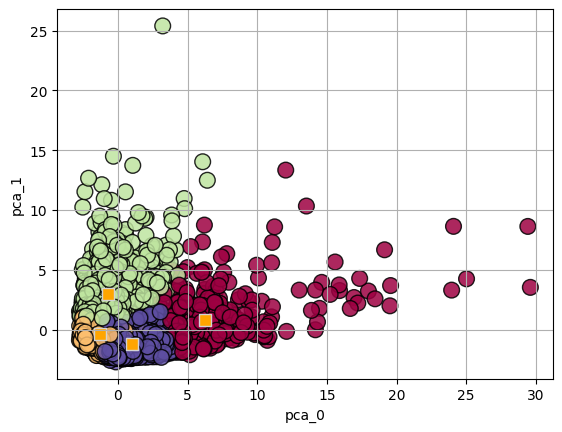

Iteration: 11


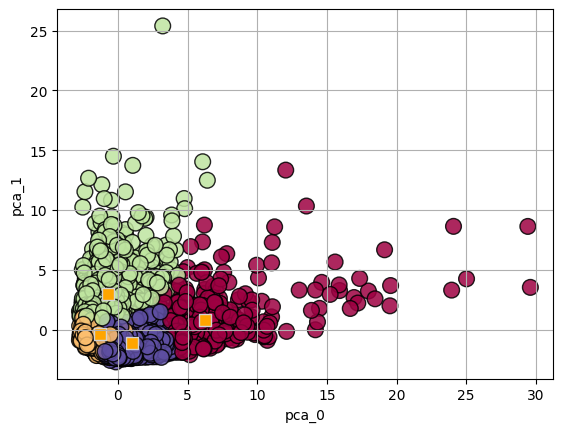

Iteration: 12


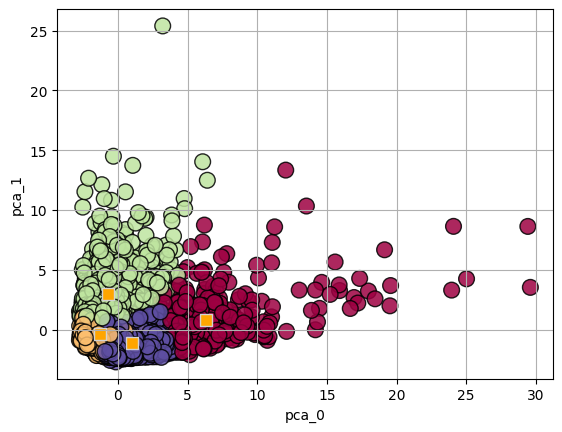

Iteration: 13


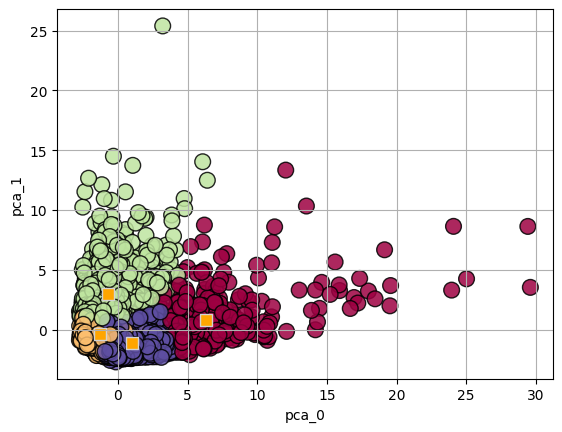

Iteration: 14


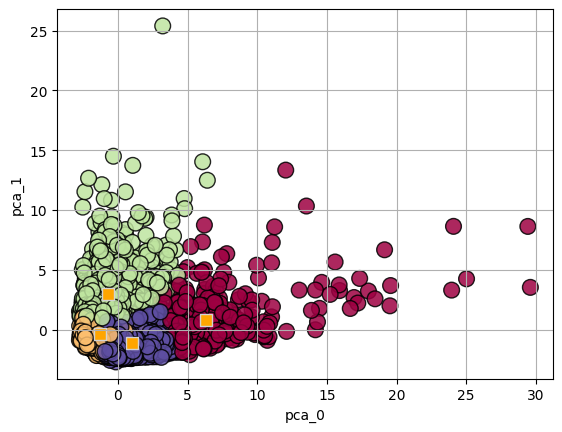

In [89]:
np.set_printoptions(precision=5, suppress=True)

for iteration in range(1, 15):
    k_means = KMeans(n_clusters=4, init='random', 
        max_iter=iteration, n_init=1, random_state=0)
    k_means.fit(pca_dataset)
    print("Iteration: %i" % (iteration))
    plt.scatter(pca_dataset.iloc[:,0], pca_dataset.iloc[:,1], s=2**7, c=k_means.labels_, 
            edgecolors='black', alpha=0.85, cmap='Spectral')

    plt.xlabel('pca_0') 
    plt.ylabel('pca_1')
    plt.grid()

    km_centers = k_means.cluster_centers_
    
    plt.scatter(km_centers[:,0], km_centers[:,1],
                s=2**6, marker='s', c='orange', edgecolors='lightgrey') 

    plt.show()

## Showing How Centroids Converged

## Understanding What Each Cluster Represents

In [44]:
dataset.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [45]:
dataset.columns

Index(['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES',
       'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',
       'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY',
       'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX',
       'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',
       'TENURE'],
      dtype='object')

### Using Permutation Importance to Select the Most Important Features

In [90]:
labels = k_means.labels_
features = dataset

In [96]:
np.unique(labels)

array([0, 1, 2, 3])

In [91]:
from sklearn.model_selection import train_test_split

feature_train, feature_test, label_train, label_test = train_test_split(features, labels, test_size=0.3, random_state=42)

In [92]:
from sklearn.ensemble import RandomForestClassifier

rf_classifier = RandomForestClassifier(n_estimators=200, random_state=42)
rf_classifier.fit(feature_train, label_train)

RandomForestClassifier(n_estimators=200, random_state=42)

In [49]:
from sklearn.inspection import permutation_importance

result = permutation_importance(rf_classifier, feature_test, 
   label_test, n_repeats=10, random_state=42, n_jobs=-1)

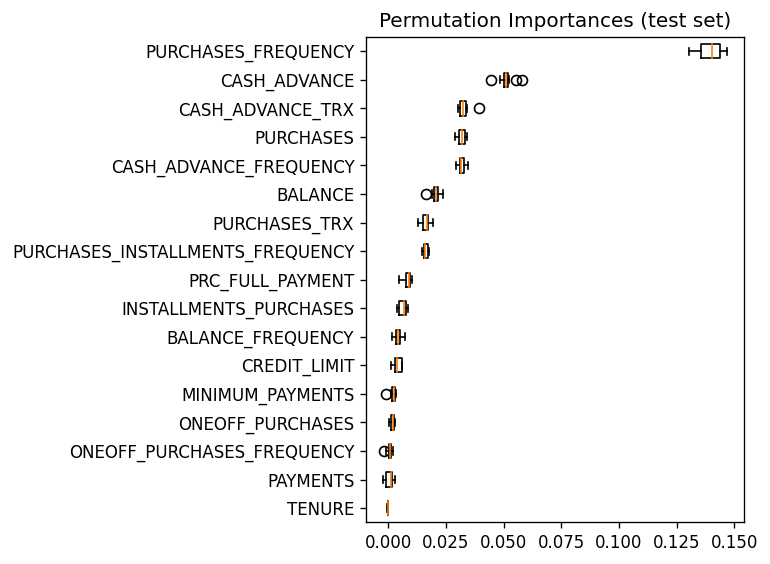

In [93]:
sorted_index = result.importances_mean.argsort()

fig, ax = plt.subplots(dpi=120)
ax.boxplot(result.importances[sorted_index].T,
           vert=False, labels=feature_test.columns[sorted_index])
ax.set_title("Permutation Importances (test set)")
fig.tight_layout()
plt.show()

In [51]:
# Selecting the five best features from the boxplot above
important_features = ['PURCHASES_FREQUENCY', 'CASH_ADVANCE', 'PURCHASES', 'CASH_ADVANCE_TRX', 'CASH_ADVANCE_FREQUENCY']

In [98]:
pca_dataset['k_means_labels'].unique()

array([1, 2, 3, 0])

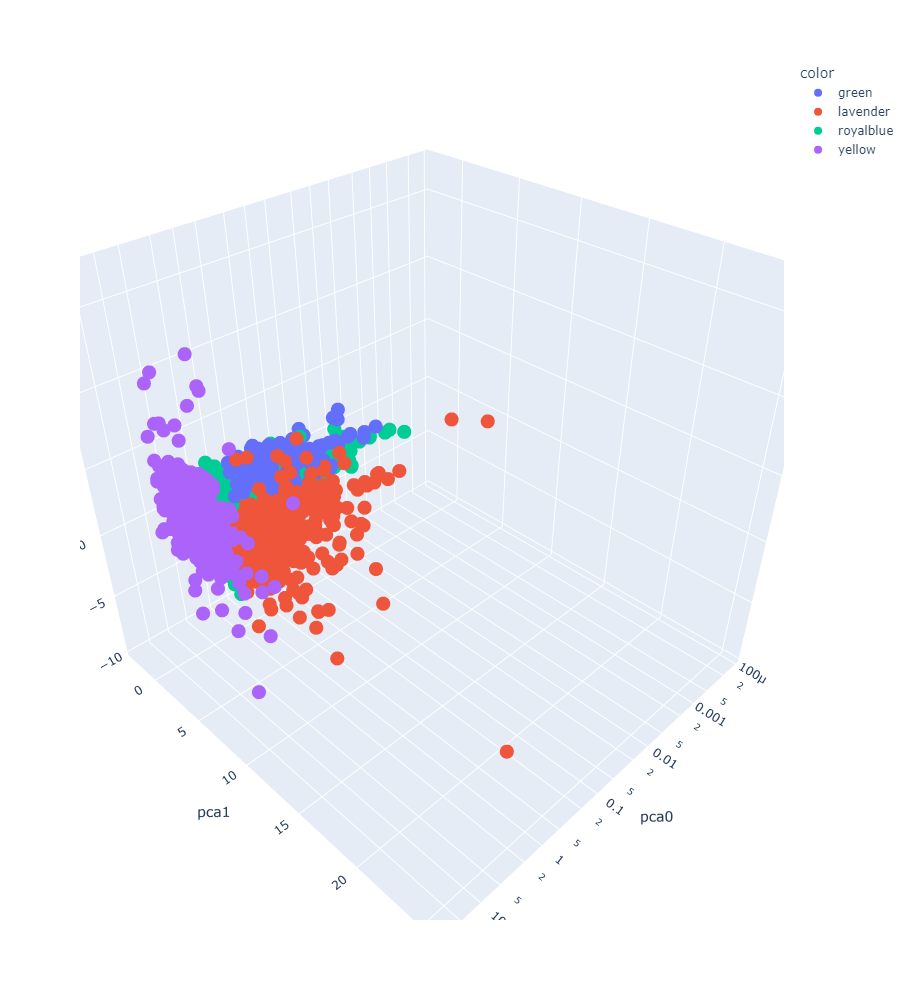

In [99]:
import plotly.express as px


colors = ['yellow', 'green', 'lavender', 'royalblue']

color_data = pca_dataset['k_means_labels'].map(lambda label: colors[label])

labels = np.array(['cluster ' + str(label) for label in k_means.labels_] )
hover_data = important_features
full_pca_dataset = pd.concat([dataset, pca_dataset], axis=1)

fig = px.scatter_3d(full_pca_dataset, x='pca0', y='pca1', z='pca2', log_x=True, color = color_data,
                     hover_name=labels, hover_data=hover_data, height=1000, width=1000)

fig.show()


In [101]:
labels

array(['cluster 1', 'cluster 2', 'cluster 3', ..., 'cluster 3',
       'cluster 1', 'cluster 1'], dtype='<U9')

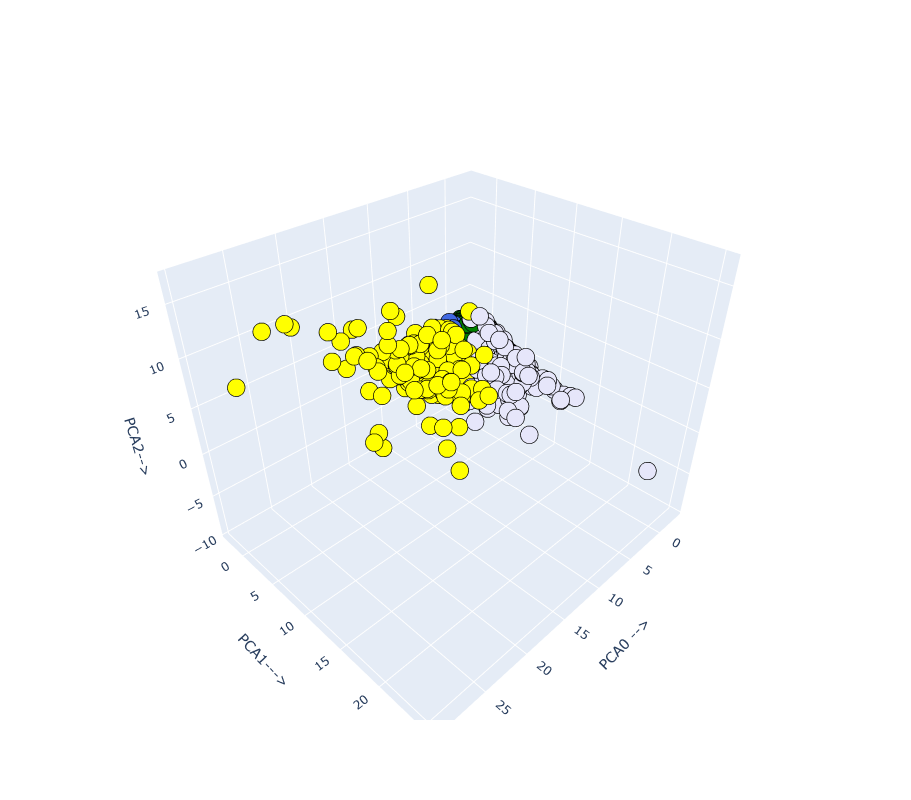

In [102]:
# 3d scatterplot using plotly

import plotly.graph_objects as go




Scene = dict(xaxis = dict(title  = 'PCA0 -->'),yaxis = dict(title  = 'PCA1--->'),zaxis = dict(title  = 'PCA2-->'))

# model.labels_ is nothing but the predicted clusters i.e y_clusters
labels = k_means.labels_
trace = go.Scatter3d(name = 'Data',
                     x=full_pca_dataset.values[:,17],
                     y=full_pca_dataset.values[:, 18],
                     z=full_pca_dataset.values[:, 19], mode='markers',
                     marker=dict(color = color_data, size= 10, 
                                 line=dict(color= 'black',width = 10)), 
                    opacity=1)



layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
#centroids_layout = go.Layout(margin=dict(l=0,r=0),scene = Scene,height = 800,width = 800)
#layout = [layout, centroids_layout]

fig = go.Figure(data = trace, layout = layout)
fig.show()

In [64]:
pca_data = full_pca_dataset[['pca0', 'pca1', 'pca2']]
pca_data

,pca0,pca1,pca2
0,-1.682360,-1.076720,0.490160
1,-1.138967,2.506112,0.602491
2,0.969377,-0.383427,0.103995
3,-0.873812,0.042929,1.461940
4,-1.599682,-0.688769,0.367029
...,...,...,...
8945,-0.359268,-2.015733,-1.002524
8946,-0.564020,-1.638742,-1.297119
8947,-0.925785,-1.810490,-0.481547
8948,-2.336211,-0.657802,0.968613


In [105]:
labeled_dataset = dataset.copy()

labeled_dataset['Cluster Label'] = k_means.labels_
labeled_dataset.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster Label
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,3
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12,1
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1


### Statistics of Clusters

In [70]:
def convert_to_position(percentile):
    percentile = str(percentile).split('.')[1]
    if(len(percentile) == 1):
        percentile = percentile + '0'
    percentile = percentile + 'TH'
    return percentile

In [74]:
# alternative way to view statistics
percentiles= np.array([0.1, 0.25, 0.5, 0.75, 0.90, 0.95, 0.99])
cluster_dataset = labeled_dataset.groupby('Cluster Label')
#cluster_dataset.drop('Cluster Label', axis=1, inplace=True)
functions = ['mean', 'min', 'max', 'percentile']
for function in functions:
   
    if(function!='percentile'):
        print(f'{function.center(100)}')
        display(cluster_dataset.apply(function))
       
    else: 
        percentile_data = cluster_dataset.quantile(q=percentiles)
        percentile_data.reset_index(1, inplace=True)
        percentile_data.rename(columns={'level_1': 'PERCENTILE'}, inplace=True)
        percentile_data['PERCENTILE'] = percentile_data['PERCENTILE'].apply(convert_to_position)
        display(percentile_data)
 
    print('\n')

                                                mean                                                


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
Cluster Label,,,,,,,,,,,,,,,,,
0,3536.334087,0.984519,7391.935270,4939.114910,2454.171712,732.781521,0.944748,0.735504,0.784497,0.079184,2.274775,85.977477,9670.157658,7175.187929,1901.283548,0.276663,11.941441
1,885.211444,0.774923,295.814502,225.651173,70.441095,444.621843,0.197065,0.093735,0.099214,0.090296,1.593641,3.334758,3183.637011,884.009999,529.561248,0.083031,11.459792
2,4035.410562,0.958875,406.383567,259.332546,147.129943,3924.524966,0.240448,0.115791,0.151113,0.449918,12.560944,6.018507,6777.411963,3070.486949,1800.185767,0.034341,11.355456
3,874.824472,0.942468,1237.129036,581.646638,655.771374,194.492779,0.893513,0.298321,0.721517,0.041069,0.756808,22.399374,4191.148749,1316.288738,653.341280,0.278031,11.606886




                                                min                                                 


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
Cluster Label,,,,,,,,,,,,,,,,,
0,34.207779,0.090909,900.87,0.0,0.0,0.0,0.083333,0.0,0.0,0.0,0,1,1000.0,0.0,108.937025,0.0,6
1,0.000000,0.000000,0.00,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0,0,150.0,0.0,0.019163,0.0,6
2,4.382924,0.181818,0.00,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0,0,50.0,0.0,16.950090,0.0,6
3,0.000000,0.000000,8.40,0.0,0.0,0.0,0.250000,0.0,0.0,0.0,0,0,300.0,0.0,0.261984,0.0,6




                                                max                                                 


,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
Cluster Label,,,,,,,,,,,,,,,,,
0,19043.138560,1.0,49039.57,40761.25,22500.00,19513.474830,1.0,1.0,1.0,1.000000,62,358,30000.0,50721.48336,76406.20752,1.0,12
1,8115.039014,1.0,4900.00,4900.00,3000.00,6523.780195,1.0,1.0,1.0,0.666667,23,43,23000.0,23150.57184,28483.25483,1.0,12
2,16304.889250,1.0,5197.22,4139.56,4059.93,47137.211760,1.0,1.0,1.0,1.500000,123,94,21500.0,39048.59762,61031.61860,1.0,12
3,8099.879299,1.0,5788.81,5788.81,4538.84,7894.578816,1.0,1.0,1.0,0.750000,23,186,25000.0,12020.18009,38512.12477,1.0,12


,PERCENTILE,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
Cluster Label,,,,,,,,,,,,,,,,,,
0,10TH,505.319289,1.000000,3504.8680,1095.2450,190.8090,0.000000,0.833333,0.250000,0.250000,0.000000,0.00,33.30,4360.0,1989.117184,194.250587,0.000000,12.0
0,25TH,877.908660,1.000000,4422.3575,2265.3125,711.3500,0.000000,1.000000,0.583333,0.666667,0.000000,0.00,50.00,6000.0,3580.611063,248.528462,0.000000,12.0
0,50TH,2518.965119,1.000000,5674.8100,3618.9550,1687.3850,0.000000,1.000000,0.833333,1.000000,0.000000,0.00,74.00,9000.0,5275.355611,750.803991,0.000000,12.0
0,75TH,5181.988474,1.000000,8288.8075,6081.4850,3088.2325,383.677038,1.000000,1.000000,1.000000,0.083333,1.00,108.00,12000.0,8267.722188,1865.893284,0.600000,12.0
0,90TH,8238.182692,1.000000,11679.5400,9434.6370,5451.6700,2474.180038,1.000000,1.000000,1.000000,0.250000,6.70,150.10,16500.0,13375.665058,4235.637126,1.000000,12.0
0,95TH,10072.710910,1.000000,17864.6315,12645.3290,7109.5200,3583.832190,1.000000,1.000000,1.000000,0.416667,12.00,198.85,18000.0,20310.094606,6755.707570,1.000000,12.0
0,99TH,14133.109688,1.000000,34016.8666,26533.1927,12662.0934,9071.852656,1.000000,1.000000,1.000000,0.833333,32.42,303.70,22285.0,35970.807037,14928.590841,1.000000,12.0
1,10TH,9.522886,0.272727,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,1000.0,104.734062,82.242448,0.000000,10.0
1,25TH,60.607512,0.545455,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.00,1500.0,254.613119,148.289340,0.000000,12.0


### Serializing the Model in a Pickle Format

In [108]:
from joblib import Parallel, delayed
import joblib
  
saved_model = k_means
file_name = 'Customer_Churn_Cluster_Analysis_model.pkl'

joblib.dump(saved_model, file_name) 
  

['Customer_Churn_Cluster_Analysis_model.pkl']